# <b>Поиск по изображениям </b>

## <b>Описание данных и задания </b>

### Техническое задание 

Фотохостинг для профессиональных фотографов «Со Смыслом» (“With Sense”), где пользователи размещают свои фотографии и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. Например, для этой фотографии.
<br>Суть эксперимента заключается в следующем: пользователь сервиса вводит описание нужной сцены — сервис выводит несколько фотографий с такой же или похожей сценой.
<br>Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Вам поручено разработать демонстрационную версию поиска изображений по запросу.
<br>Для демонстрационной версии нужно выбрать лучшую модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу. 
<br>На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.
<br>
<br>В некоторых странах, где работает “With Sense”, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.
<br>
<br>В “With Sense” строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер — This image is unavailable in your country in compliance with local laws.
Однако в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

### Файлы 

<b>train_dataset.csv</b> — собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.
<br><b>CrowdAnnotations.tsv</b> — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
<br>Имя файла изображения.
<br>Идентификатор описания.
<br>Доля людей, подтвердивших, что описание соответствует изображению.
<br>Количество человек, подтвердивших, что описание соответствует изображению.
<br>Количество человек, подтвердивших, что описание не соответствует изображению.
<br><b>ExpertAnnotations.tsv</b> содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
<br>Имя файла изображения.
<br>Идентификатор описания.
<br>3, 4, 5 — оценки трёх экспертов.
<br>Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.
<br><b>test_queries.csv</b> находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.
<br><b>test_images.csv</b> список тестовых изображений.

## <b>Импорт библиотек и функций</b>

### Библиотеки

In [83]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import seaborn as sns, numpy as np

import re
import spacy

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

from transformers import BertTokenizer, BertModel
from tqdm import tqdm 

from sklearn.model_selection import GroupShuffleSplit
RANDOM_STATE = 42

import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import torch
import os
from PIL import Image
from torchvision import models, transforms

### Функции

In [84]:
line_1 = '-'*130
line_2 = '-'*50

def percentage_passes (dataset):
    print(dataset.info())
    print(line_2)
    print('Количество пропущенных значений таблицы:')
    for col in dataset.columns:
        datcol = np.sum(dataset[col].isnull())
        print(col, datcol)  
        
    print(line_2)
    print('Количество дубликатов -', dataset.duplicated().sum())

def direct_diagram(variable, column):
    display(variable[column].unique())
    plt.figure(figsize=(5,3))
    plot = sns.countplot(y=column, data=variable)
    plot.set_title(f'Рапределение по - {column}', fontsize=15)
    plot.set_xlabel('Количество', fontsize=10)
    plt.show()

## <b>Загрузка и изучение данных</b>

Создам переменную в которой укажу путь к файлу.

In [85]:
PATH = '/kaggle/input/poisk-izobrazheniya-po-opisaniyu/to_upload/'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Для начала загружу только тренировочные датасеты. 

In [86]:
train_dataset = pd.read_csv(PATH+'train_dataset.csv')

percentage_passes(train_dataset)
print(line_1)
train_dataset.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None
--------------------------------------------------
Количество пропущенных значений таблицы:
image 0
query_id 0
query_text 0
--------------------------------------------------
Количество дубликатов - 0
----------------------------------------------------------------------------------------------------------------------------------


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [87]:
print(f'Количество уникальных значений для столбца image - {train_dataset.image.nunique()}')
print(line_1)
print(f'Количество уникальных значений для столбца query_id - {train_dataset.query_id.nunique()}')
print(line_1)
print(f'Количество уникальных значений для столбца query_text - {train_dataset.query_text.nunique()}')

Количество уникальных значений для столбца image - 1000
----------------------------------------------------------------------------------------------------------------------------------
Количество уникальных значений для столбца query_id - 977
----------------------------------------------------------------------------------------------------------------------------------
Количество уникальных значений для столбца query_text - 977


Датасет train_dataset имеет 3 столбца:
<br>image — имя изображения — 1000 уникальных изображений. 
<br>query_id — id запроса/описания — 977 уникальных id запроса/описания.
<br>query_text — текст запроса/описания — 977 уникальных текстов запроса/описания.
<br>Получается, что каждое изображение встречается в среднем 5 или 6 раз и для каждого изображения есть по 5 или 6 запросов/описаний.
<br>В датасете 5822 строки.
<br>Пропусков или дубликатов в датасете нет.

In [88]:
crowd = pd.read_csv(PATH+'CrowdAnnotations.tsv', 
                    sep='\t', 
                    names=['image', 
                           'query_id', 
                           'fraction', 
                           'respond', 
                           'not_correspond'])

percentage_passes(crowd)
print(line_1)
crowd.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           47830 non-null  object 
 1   query_id        47830 non-null  object 
 2   fraction        47830 non-null  float64
 3   respond         47830 non-null  int64  
 4   not_correspond  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
None
--------------------------------------------------
Количество пропущенных значений таблицы:
image 0
query_id 0
fraction 0
respond 0
not_correspond 0
--------------------------------------------------
Количество дубликатов - 0
----------------------------------------------------------------------------------------------------------------------------------


,image,query_id,fraction,respond,not_correspond
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [89]:
print(f'Количество уникальных значений для столбца image - {crowd.image.nunique()}')
print(line_1)
print(f'Количество уникальных значений для столбца query_id - {crowd.query_id.nunique()}')

Количество уникальных значений для столбца image - 1000
----------------------------------------------------------------------------------------------------------------------------------
Количество уникальных значений для столбца query_id - 1000


Уникальных значений в query_id больше, чем в таблице train_dataset. Удалю несоответствующие значения.

In [90]:
not_unique = []

for query_id in crowd['query_id'].unique():
    if query_id not in train_dataset['query_id'].unique():
        not_unique.append(query_id)

for query_id in not_unique:
    crowd = crowd.drop(
        crowd[crowd.query_id == query_id].index
    )
print(f'Количество уникальных значений для столбца query_id - {crowd.query_id.nunique()}')

Количество уникальных значений для столбца query_id - 977


Теперь уникальные значения совпадают.

array([1.        , 0.        , 0.33333333, 0.66666667, 0.25      ,
       0.6       , 0.2       , 0.5       , 0.4       , 0.75      ,
       0.16666667, 0.8       ])

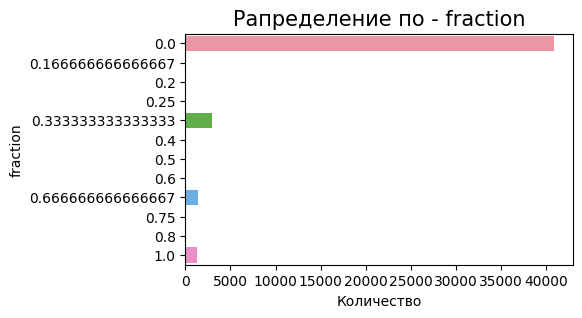

----------------------------------------------------------------------------------------------------------------------------------


array([3, 0, 1, 2, 4, 5])

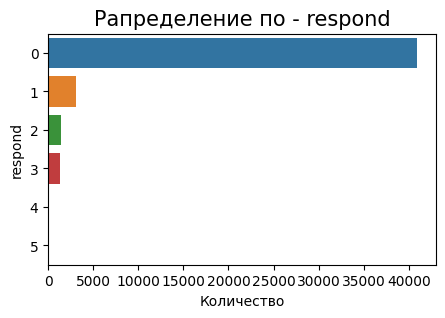

----------------------------------------------------------------------------------------------------------------------------------


array([0, 3, 2, 1, 4, 5, 6])

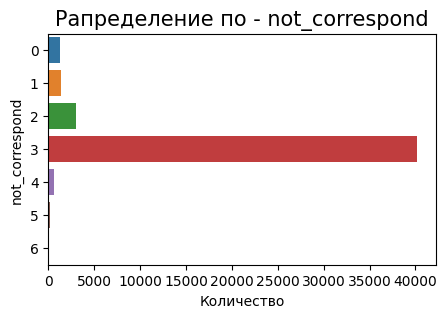

----------------------------------------------------------------------------------------------------------------------------------


In [91]:
direct_diagram(crowd,'fraction')
print(line_1)
direct_diagram(crowd,'respond')
print(line_1)
direct_diagram(crowd,'not_correspond')
print(line_1)

Датасет train_dataset имеет 5 столбца:
<br>image — имя изображения — 1000 уникальных изображений. 
<br>query_id — id запроса/описания — 977 уникальных id запроса/описания.
<br>fraction — текст запроса/описания — доля людей, подтвердивших, что описание соответствует изображению.
<br>respond - количество человек, подтвердивших, что описание соответствует изображению.
<br>not_correspond - количество человек, подтвердивших, что описание не соответствует изображению.
<br>В датасете 47830 строки.
<br>Пропусков или дубликатов в датасете нет.
<br>После изучения данных можно сденлать вывод что большинство  исполнителей подтверждают что запрос/описание не соответствуют фотографии. Также по столбцу fraction сложно дать какое либо четкое описание, так-как в подтверждении могло участвовать от 3х до 6 человек за раз. 

In [92]:
expert = pd.read_csv(PATH + 'ExpertAnnotations.tsv', sep='\t', 
                    names=['image', 
                           'query_id', 
                           'expert_1', 
                           'expert_2', 
                           'expert_3'])
percentage_passes(expert)
print(line_1)
expert.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
None
--------------------------------------------------
Количество пропущенных значений таблицы:
image 0
query_id 0
expert_1 0
expert_2 0
expert_3 0
--------------------------------------------------
Количество дубликатов - 0
----------------------------------------------------------------------------------------------------------------------------------


,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [93]:
print(f'Количество уникальных значений для столбца image - {expert.image.nunique()}')
print(line_1)
print(f'Количество уникальных значений для столбца query_id - {expert.query_id.nunique()}')

Количество уникальных значений для столбца image - 1000
----------------------------------------------------------------------------------------------------------------------------------
Количество уникальных значений для столбца query_id - 977


array([1, 2, 3, 4])

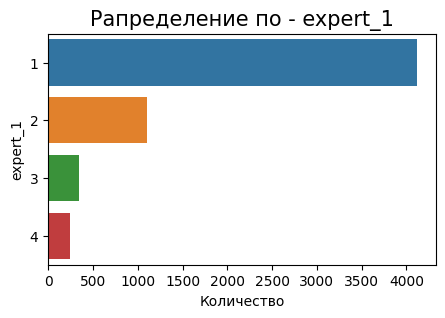

----------------------------------------------------------------------------------------------------------------------------------


array([1, 2, 3, 4])

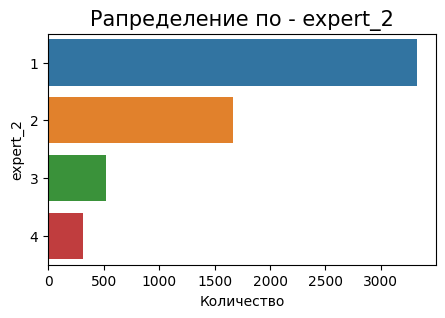

----------------------------------------------------------------------------------------------------------------------------------


array([1, 2, 3, 4])

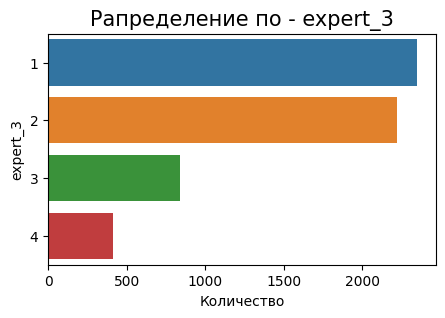

In [94]:
direct_diagram(expert, 'expert_1')
print(line_1)
direct_diagram(expert, 'expert_2')
print(line_1)
direct_diagram(expert, 'expert_3')

Датасет train_dataset имеет 5 столбца:
<br>image — имя изображения — 1000 уникальных изображений. 
<br>query_id — id запроса/описания — 977 уникальных id запроса/описания.
<br>expert_1 — оценка 1 эксперта.
<br>expert_2 - оценка 2 эксперта.
<br>expert_3 - оценка 3 эксперта.
<br>В датасете 5822 строки.
<br>Пропусков или дубликатов в датасете нет.
<br>После изучения данных можно сделать вывод, что эксперты также зачастую не подтверждают, что изображения совпадают с запросом/описанием.

### Объединение столбцов и создание целевого признака.

Удалю строки где мнение каждого эксперта разделилось.

In [95]:
expert = expert.drop(expert[(expert.expert_1 != expert.expert_2) &
                        (expert.expert_2 != expert.expert_3) &
                        (expert.expert_3 != expert.expert_1)].index)
expert.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5696 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5696 non-null   object
 1   query_id  5696 non-null   object
 2   expert_1  5696 non-null   int64 
 3   expert_2  5696 non-null   int64 
 4   expert_3  5696 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 267.0+ KB


При удалении оценок датасет уменьшилося на 126 строк. Это примерно 2.16% 

Создам агрегированный столбец с оценками экспертов и сразу выдам результат по шкале от 0 до 1

In [96]:
expert['aggregated_estimates'] = expert.mode(axis=1)[0]
expert['aggregated_estimates'] = (expert['aggregated_estimates']-1) / 3 

expert.head()

,image,query_id,expert_1,expert_2,expert_3,aggregated_estimates
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000


Сначала объединю таблицы с оценками по двум столбцам, чтобы учесть все имеющиеся сочетания id картинки и id текста.

In [97]:
data = crowd.merge(expert, how='outer', on=['image', 'query_id'])

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50159 entries, 0 to 50158
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   image                 50159 non-null  object 
 1   query_id              50159 non-null  object 
 2   fraction              46721 non-null  float64
 3   respond               46721 non-null  float64
 4   not_correspond        46721 non-null  float64
 5   expert_1              5696 non-null   float64
 6   expert_2              5696 non-null   float64
 7   expert_3              5696 non-null   float64
 8   aggregated_estimates  5696 non-null   float64
dtypes: float64(7), object(2)
memory usage: 3.4+ MB


In [98]:
data.head()

,image,query_id,fraction,respond,not_correspond,expert_1,expert_2,expert_3,aggregated_estimates
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3.0,0.0,NaN,NaN,NaN,NaN
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0.0,3.0,NaN,NaN,NaN,NaN
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0.0,3.0,NaN,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0.0,3.0,NaN,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0.0,3.0,NaN,NaN,NaN,NaN


Слияние прошло успешно. В столбцах с оценками экспертов образовалось много пропусков, это нормально из-за их меньшего количества.

Теперь таблицу с оценками объединю с таблицей с текстом, для начала создам датасет с уникальными парами картинка — описание и буду соединять с ним.

In [99]:
service_dataframe = train_dataset[['query_id', 'query_text']].drop_duplicates()
service_dataframe.head()

,query_id,query_text
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
12,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...
22,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
27,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...
31,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .


In [100]:
data = data.merge(service_dataframe,on='query_id',how='left')

In [101]:
percentage_passes(data)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50159 entries, 0 to 50158
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   image                 50159 non-null  object 
 1   query_id              50159 non-null  object 
 2   fraction              46721 non-null  float64
 3   respond               46721 non-null  float64
 4   not_correspond        46721 non-null  float64
 5   expert_1              5696 non-null   float64
 6   expert_2              5696 non-null   float64
 7   expert_3              5696 non-null   float64
 8   aggregated_estimates  5696 non-null   float64
 9   query_text            50159 non-null  object 
dtypes: float64(7), object(3)
memory usage: 3.8+ MB
None
--------------------------------------------------
Количество пропущенных значений таблицы:
image 0
query_id 0
fraction 3438
respond 3438
not_correspond 3438
expert_1 44463
expert_2 44463
expert_3 44463
aggregated_estimate

Дубликатов нет. ТОлько пропуски.

Удалю лишние столбцы, так как модель будет предсказывать только на векторах текста и изображения.

In [102]:
data = data.drop(['respond', 'not_correspond', 'expert_1', 'expert_2', 'expert_3'], axis=1)

За целевую переменную оставлю столбец aggregated_estimates, пропуски в этом столбце заменю на значения из столбца fraction.

In [103]:
data.aggregated_estimates = data.aggregated_estimates.fillna(data.fraction)

data = data.drop('fraction', axis=1)

In [104]:
percentage_passes(data)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50159 entries, 0 to 50158
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   image                 50159 non-null  object 
 1   query_id              50159 non-null  object 
 2   aggregated_estimates  50159 non-null  float64
 3   query_text            50159 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.5+ MB
None
--------------------------------------------------
Количество пропущенных значений таблицы:
image 0
query_id 0
aggregated_estimates 0
query_text 0
--------------------------------------------------
Количество дубликатов - 0


In [105]:
data.head()

,image,query_id,aggregated_estimates,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,"A woman is signaling is to traffic , as seen f..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,A boy in glasses is wearing a red shirt .
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,A young boy holds onto a blue handle on a pier .
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,"A woman wearing black clothes , a purple scarf..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,An older woman with blond hair rides a bicycle...


Пропусков в целевой переменной нет.

Были объединены таблицы crowd и expert с таблицей train_dataset, где была выделена одна целевая переменная с агрегированными оценками экспертов и немного оценками из краудсорсинга. В итоге была создана таблица data.

## Проверка данных

Для начала очищу текст.

In [106]:
def clear(text):
    text = text.lower()
    clean = " ".join(re.sub(r'[^a-zA-z]', ' ', text).lower().split())
    return clean

data['lem_query_text'] = data['query_text'].apply(clear)

Теперь лематизирую его.

In [107]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

def lemmatize_text(df):
    df['lem_query_text'] = df['query_text'].apply(lambda text: " ".join([token.lemma_ for token in nlp(text)]))    
    return df
    
data = lemmatize_text(data)

Удалю строки описание которых содержит слова из списка block.

In [108]:
block = ['boy', 'girl', 'child', 'teenage', 'teenager', 'kid', 'baby']

data = data[data["lem_query_text"].str.contains('|'.join(block)) == False]

percentage_passes(data)

data.head()

<class 'pandas.core.frame.DataFrame'>
Index: 36008 entries, 0 to 50158
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   image                 36008 non-null  object 
 1   query_id              36008 non-null  object 
 2   aggregated_estimates  36008 non-null  float64
 3   query_text            36008 non-null  object 
 4   lem_query_text        36008 non-null  object 
dtypes: float64(1), object(4)
memory usage: 1.6+ MB
None
--------------------------------------------------
Количество пропущенных значений таблицы:
image 0
query_id 0
aggregated_estimates 0
query_text 0
lem_query_text 0
--------------------------------------------------
Количество дубликатов - 0


,image,query_id,aggregated_estimates,query_text,lem_query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,"A woman is signaling is to traffic , as seen f...","a woman be signal be to traffic , as see from ..."
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,"A woman wearing black clothes , a purple scarf...","a woman wear black clothe , a purple scarf , a..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,An older woman with blond hair rides a bicycle...,an old woman with blond hair ride a bicycle do...
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.0,A woman wearing a white glove peers over the c...,a woman wear a white glove peer over the crowd .
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.0,A man taking a picture with a silver camera .,a man take a picture with a silver camera .


Текст из столбца query_text был очищен и лемматизирован. Также были удалены строки с запрещенным контентом на изображениях, тем самым таблица data уменьшилась на 14 151 строку, что составляет 18% датасета.

## Векторизация изображений и текстов

Загружу и просмотрю изображения. 

Found 36008 validated image filenames.


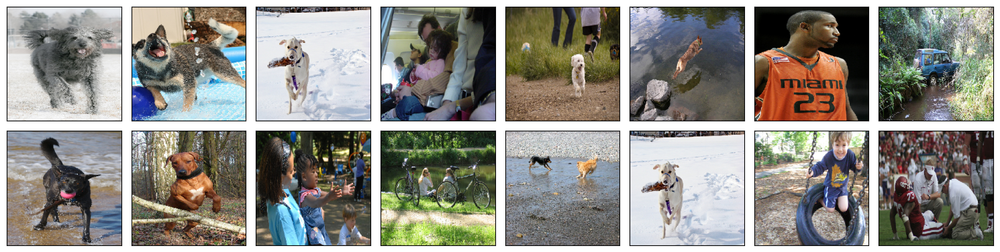

In [109]:
train_datagen = ImageDataGenerator(rescale=1./255)

train_images = train_datagen.flow_from_dataframe(
        dataframe=data,
        directory= PATH +'train_images',
        x_col='image',
        y_col='target',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=12345)


features, target = next(train_images)

fig = plt.figure(figsize=(15,15))
for i in range(16):
    fig.add_subplot(8,8, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()


Так как изображения загружались в соответствии с уже удаленными строками таблицы data, то тут можно сказать, что не все нежелательные изображения были удалены. Причина этого может заключаться в том, что не всегда в описании может быть указано то, что на фото дети, или описание не говорит об этом прямолинейно.

Для создания векторов модели буду использовать ResNet18.

In [110]:
model = models.resnet18(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1])
model = model.to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def vectorize_image(image_path, model, preprocess, device):
    image = Image.open(image_path).convert('RGB')
    image = preprocess(image)
    image = image.unsqueeze(0).to(device)
        
    with torch.no_grad():
        features = model(image)
        
    return features.cpu().numpy().squeeze()

image_vectors = []
total_images = len(data['image'])
processed_count = 0

for image_name in data['image']:
    processed_count += 1
    percentage = round((processed_count / total_images) * 100, 2) 
    image_path = os.path.join(PATH, 'train_images', image_name)
    
    print(f"\rОбработка: {percentage}% ({processed_count}/{total_images}) - {image_name}", end='')
    
    if os.path.exists(image_path):
        vectorized_image = vectorize_image(image_path, model, preprocess, device)
        if vectorized_image is not None:
            image_vectors.append(vectorized_image)
    else:
        print(f"\nФайл не найден: {image_path}")

print("\n")  

if image_vectors:
    image_vectors = np.vstack(image_vectors)
    print(f"Размер матрицы: {image_vectors.shape}")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 157MB/s] 


Обработка: 100.0% (36008/36008) - 997722733_0cb5439472.jpgg

Размер матрицы: (36008, 512)


Теперь векторизую текст

In [111]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model_bert = BertModel.from_pretrained('bert-base-uncased')

model_bert.to(device)

def bert_vectorize(text):
    inputs = tokenizer(
        text,
        padding=True,
        truncation=True,
        max_length=512,
        return_tensors='pt'
    ).to(device)
    
    with torch.no_grad():
        outputs = model_bert(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
    
    return embeddings

bert_text = [
    bert_vectorize(text) 
    for text in data['lem_query_text']
]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [112]:
vektor_text_train = np.array(bert_text)
vektor_text_train = np.squeeze(vektor_text_train)

vektor_text_train.shape

(36008, 768)

Объединю вектора.

In [113]:
final_vector = np.concatenate([image_vectors, vektor_text_train], axis=1)
final_vector.shape

(36008, 1280)

Целевое значение так-же переведу в вектор.

In [114]:
target = data['aggregated_estimates'].to_numpy()
target.shape

(36008,)

Матрицы изображений и текстов были объединены в переменную vect, размер матрицы составил - 36008, 3007
<br>Целевой признак также был переведен в матрицу, размер матрицы — 36008
<br>Также было выявлено, что не все нежелательные изображения были удалены. Причина этого может заключаться в том, что не всегда в описании может быть указано то, что на фото дети, или описание не говорит об этом прямолинейно.

## Обучение модели предсказания соответствия

В качестве метрики буду использовать MSE так как с её помощью можно понять на сколько в среднем ошибается та или иная модель. Простыми словами MSE метрика показывает насколько хорошо работает модель машинного обучения при предсказании числовых значений.

In [115]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=RANDOM_STATE)


train, test = next(gss.split(X=final_vector, y=target, groups=data['image']))

X_train, X_val = final_vector[train], final_vector[test]
y_train, y_val = target[train], target[test]


print(f"Строк в тренировочном датасете - {len(X_train)}") 
print(line_1)
print(f"Строк в тестовом датасете - {len(X_val)}")

Строк в тренировочном датасете - 25049
----------------------------------------------------------------------------------------------------------------------------------
Строк в тестовом датасете - 10959


Создам функцию для вывода результатов обучения моделей с разными параметрами.

In [116]:
def best_model(mod, params):
    grid = GridSearchCV(mod, params, n_jobs=-1, cv=5, scoring='neg_mean_squared_error')
    grid.fit(X_train, y_train)
    print('Лучшие параметры модели', grid.best_estimator_)
    print(line_2)
    print('MSE на X_train', round(grid.best_score_, 2))
    print(line_2)
    y_val_pred = grid.best_estimator_.predict(X_val)
    print('MSE на X_val', round(mean_squared_error(y_val, y_val_pred),2))
    return grid.best_estimator_

### LinearRegression

Сначала обучу LinearRegression без перебора параметров. 

In [117]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
y_train_pred = model_lr.predict(X_train)

print('MSE на X_train', round(mean_squared_error(y_train, y_train_pred),2))
y_val_pred = model_lr.predict(X_val)
print(line_2)
print('MSE на X_val', round(mean_squared_error(y_val, y_val_pred),2))

MSE на X_train 0.04
--------------------------------------------------
MSE на X_val 0.05


### KNeighborsRegressor

Так как LinearRegression справилась отлично, KNeighborsRegressor обучу на небольшом количестве гиперпараметров.

In [118]:
model_knr = KNeighborsRegressor()

hyperparams_knr = {  
        'weights': ['uniform', 'distance'],  
        'algorithm': ['auto', 'brute']
}

knr = best_model(model_knr, hyperparams_knr)

Лучшие параметры модели KNeighborsRegressor(weights='distance')
--------------------------------------------------
MSE на X_train -0.06
--------------------------------------------------
MSE на X_val 0.05


Даже с переборами гиперпараметров модель показала результат хуже, чем у LinearRegression.

### DecisionTreeRegressor

In [119]:
model_dtr = DecisionTreeRegressor(random_state=RANDOM_STATE)

hyperparams_dtr = { 
        'max_depth': range(2, 5),
        'max_features': range(2, 5)
}

model_dtr = best_model(model_dtr, hyperparams_dtr)

Лучшие параметры модели DecisionTreeRegressor(max_depth=3, max_features=4, random_state=42)
--------------------------------------------------
MSE на X_train -0.05
--------------------------------------------------
MSE на X_val 0.05


Результат такой же, как и у LinearRegression.

### XGBRegressor

In [120]:
model_xgbr = XGBRegressor(objective='reg:squarederror')
model_xgbr.fit(X_train, y_train)
y_train_pred = model_xgbr.predict(X_train)

print('MSE на X_train', round(mean_squared_error(y_train, y_train_pred),2))
y_val_pred = model_xgbr.predict(X_val)
print(line_2)
print('MSE на X_val', round(mean_squared_error(y_val, y_val_pred),2))

MSE на X_train 0.01
--------------------------------------------------
MSE на X_val 0.05


Результат такой же, как и у LinearRegression.

### LGBMRegressor

In [121]:
model_lgbmr = LGBMRegressor(learning_rate=0.1, num_leaves=100, random_state=RANDOM_STATE)
model_lgbmr.fit(X_train, y_train)
y_train_pred = model_lgbmr.predict(X_train)

print('MSE на X_train', round(mean_squared_error(y_train, y_train_pred),2))
y_val_pred = model_lgbmr.predict(X_val)
print(line_2)
print('MSE на X_val', round(mean_squared_error(y_val, y_val_pred),2))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.456450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 323117
[LightGBM] [Info] Number of data points in the train set: 25049, number of used features: 1280
[LightGBM] [Info] Start training from score 0.090222
MSE на X_train 0.01
--------------------------------------------------
MSE на X_val 0.04


Результат такой же, как и у LinearRegression.

### baseline

Обучу полносвязную нейронную сеть с 3 слоями.

In [122]:
nn_model = Sequential([
    Dense(256, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dense(1)
])

nn_model.compile(optimizer=Adam(learning_rate=0.0001), 
                loss='mse', 
                metrics=['mae'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

nn_model.fit(X_train, y_train, 
            validation_split=0.2, 
            epochs=800, 
            batch_size=250, 
            callbacks=[early_stop], 
            verbose=0)

nn_preds = nn_model.predict(X_val).flatten()

print('MSE на X_val', round(mean_squared_error(y_val, nn_preds), 2))

W0000 00:00:1751095999.212541      35 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE на X_val 0.04


MSE на LinearRegression - 0.05
<br>MSE на KNeighborsRegressor - 0.06
<br>MSE на DecisionTreeRegressor - 0.05
<br>MSE на XGBRegressor - 0.05
<br>MSE на LGBMRegressor - 0.05
<br>MSE на baseline - 0.05

### Тестирование модели

Загружу список с именами тестовых изображений. 

In [123]:
test_images = pd.read_csv(PATH + 'test_images.csv')

percentage_passes(test_images)
print(line_1)
test_images.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes
None
--------------------------------------------------
Количество пропущенных значений таблицы:
image 0
--------------------------------------------------
Количество дубликатов - 0
----------------------------------------------------------------------------------------------------------------------------------


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [124]:
print(f'Количество уникальных значений для столбца image - {test_images.image.nunique()}')

Количество уникальных значений для столбца image - 100


In [125]:
test_queries = pd.read_csv(PATH + 'test_queries.csv', sep='|')
test_queries.columns=['index', 
                         'query_id', 
                         'query_text', 
                         'image']

percentage_passes(test_queries)
print(line_1)
test_queries.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   index       500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB
None
--------------------------------------------------
Количество пропущенных значений таблицы:
index 0
query_id 0
query_text 0
image 0
--------------------------------------------------
Количество дубликатов - 0
----------------------------------------------------------------------------------------------------------------------------------


,index,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [126]:
print(f'Количество уникальных значений для столбца image - {test_queries.query_id.nunique()}')
print(line_1)
print(f'Количество уникальных значений для столбца image - {test_queries.query_text.nunique()}')
print(line_1)
print(f'Количество уникальных значений для столбца image - {test_queries.image.nunique()}')

Количество уникальных значений для столбца image - 500
----------------------------------------------------------------------------------------------------------------------------------
Количество уникальных значений для столбца image - 500
----------------------------------------------------------------------------------------------------------------------------------
Количество уникальных значений для столбца image - 100


Так как на сайте в принципе не должно быть запрещённых изображений, сразу удалю их из датасета.

In [127]:
test_queries['query_text'].apply(clear) 

test_queries = lemmatize_text(test_queries) 


test_queries = test_queries[test_queries["lem_query_text"].str.contains('|'.join(block)) == False]


test_queries.head()

,index,query_id,query_text,image,lem_query_text
11,11,123997871_6a9ca987b1.jpg#1,Several female lacrosse players are going afte...,123997871_6a9ca987b1.jpg,several female lacrosse player be go after a b...
13,13,123997871_6a9ca987b1.jpg#3,The woman lacrosse player in blue is about to ...,123997871_6a9ca987b1.jpg,the woman lacrosse player in blue be about to ...
14,14,123997871_6a9ca987b1.jpg#4,Women play lacrosse .,123997871_6a9ca987b1.jpg,woman play lacrosse .
15,15,1319634306_816f21677f.jpg#0,A brown dog is sitting in some long grass .,1319634306_816f21677f.jpg,a brown dog be sit in some long grass .
16,16,1319634306_816f21677f.jpg#1,A brown dog sits still on a hillside .,1319634306_816f21677f.jpg,a brown dog sit still on a hillside .


Found 331 validated image filenames.


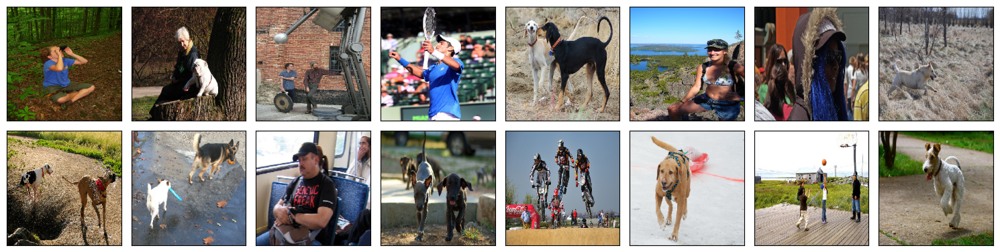

In [128]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_images_image = test_datagen.flow_from_dataframe(
        dataframe=test_queries,
        directory= PATH +'test_images',
        x_col='image',
        y_col='target',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=12345)


features, target = next(test_images_image)

fig = plt.figure(figsize=(15,15))
for i in range(16):
    fig.add_subplot(8,8, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

На изображениях детей нет.

Теперь векторизирую изображения. 

In [129]:
image_vectors_test = []
total_images = len(test_images['image'])
processed_count = 0

for image_name in test_images['image']:
    processed_count += 1
    percentage = round((processed_count / total_images) * 100, 2) 
    image_path = os.path.join(PATH, 'test_images', image_name)
    
    print(f"\rОбработка: {percentage}% ({processed_count}/{total_images}) - {image_name}", end='')
    
    if os.path.exists(image_path):
        vectorized_image = vectorize_image(image_path, model, preprocess, device)
        if vectorized_image is not None:
            image_vectors_test.append(vectorized_image)
    else:
        print(f"\nФайл не найден: {image_path}")

print("\n")  

if image_vectors_test:
    image_vectors_test = np.vstack(image_vectors_test)
    print(f"Размер матрицы: {image_vectors_test.shape}")

Обработка: 100.0% (100/100) - 2346402952_e47d0065b6.jpg

Размер матрицы: (100, 512)


In [130]:
vector_list = image_vectors_test.tolist()

test_images['features'] = vector_list

test_images.head()

,image,features
0,3356748019_2251399314.jpg,"[0.6692484021186829, 0.0045117903500795364, 0...."
1,2887171449_f54a2b9f39.jpg,"[0.9496338367462158, 3.2524518966674805, 0.698..."
2,3089107423_81a24eaf18.jpg,"[1.4175819158554077, 0.9734967350959778, 0.584..."
3,1429546659_44cb09cbe2.jpg,"[0.18978744745254517, 1.8764681816101074, 0.82..."
4,1177994172_10d143cb8d.jpg,"[0.44397085905075073, 2.334721088409424, 0.006..."


### Тестирование модели

In [131]:
def image_selection(text):
    clean_text = " ".join(re.sub(r'[^a-zA-z]', ' ', text).lower().split())
    
    lem_text = " ".join([token.lemma_ for token in nlp(clean_text)])
    
    bert_text_test = bert_vectorize(text)
    vektor_text_test = np.array(bert_text_test)
    vektor_text_test = np.squeeze(vektor_text_test)
    
    similarity_scores = []
    
    for index, row in test_images.iterrows():
        image_embedding = row['features']
        
        combined_embedding = np.concatenate([image_embedding, vektor_text_test])
        
        input_tensor = torch.tensor(combined_embedding, dtype=torch.float32).unsqueeze(0)
        
        score = nn_model.predict(input_tensor, verbose=0).flatten()
        similarity_scores.append(score.tolist())
    
    
    best_image_index = np.argmax(similarity_scores)
    
    print("Индекс лучшего изображения:", best_image_index)
    
    best_image_filename = test_images.iloc[best_image_index]['image']
    best_score = similarity_scores[best_image_index]
    
    print('Текст запроса -', text)
    print('Название изображения -', best_image_filename)
    print('Метрика изображения -', best_score)
    
    display(Image.open(PATH + 'test_images/' + test_images.loc[best_image_index, 'image']).convert('RGB'))

In [132]:
def image_selection_lr(text):
    clean_text = " ".join(re.sub(r'[^a-zA-z]', ' ', text).lower().split())
    
    lem_text = " ".join([token.lemma_ for token in nlp(clean_text)])
    
    bert_text_test = bert_vectorize(text)
    vektor_text_test = np.array(bert_text_test)
    vektor_text_test = np.squeeze(vektor_text_test)
    
    similarity_scores = []
    
    for index, row in test_images.iterrows():
        image_embedding = row['features']
        
        combined_embedding = np.concatenate([image_embedding, vektor_text_test])
        
        input_tensor = torch.tensor(combined_embedding, dtype=torch.float32).unsqueeze(0)
        
        score = model_lr.predict(input_tensor).flatten()
        similarity_scores.append(score.tolist())
    
    
    best_image_index = np.argmax(similarity_scores)
    
    print("Индекс лучшего изображения:", best_image_index)
    
    best_image_filename = test_images.iloc[best_image_index]['image']
    best_score = similarity_scores[best_image_index]
    
    print('Текст запроса -', text)
    print('Название изображения -', best_image_filename)
    print('Метрика изображения -', best_score)
    
    display(Image.open(PATH + 'test_images/' + test_images.loc[best_image_index, 'image']).convert('RGB'))

Индекс лучшего изображения: 90
Текст запроса - Man rides on bicycle as other people walk .
Название изображения - 3386953179_84c2d7922f.jpg
Метрика изображения - [0.11724137514829636]


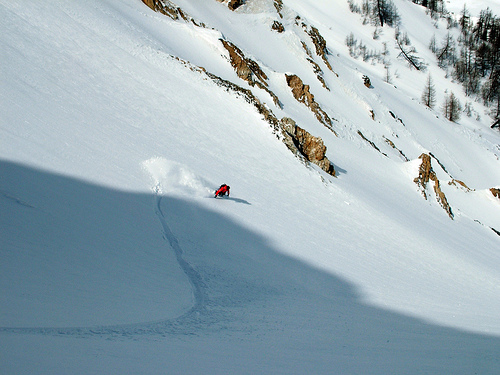

Индекс лучшего изображения: 88
Текст запроса - A dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .
Название изображения - 3262849619_0bc4f88ef9.jpg
Метрика изображения - [0.16030670702457428]


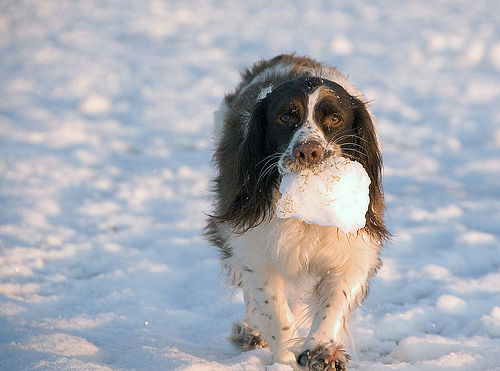

Индекс лучшего изображения: 88
Текст запроса - A woman in a red coat takes a picture near marble columns at twilight .
Название изображения - 3262849619_0bc4f88ef9.jpg
Метрика изображения - [0.16122275590896606]


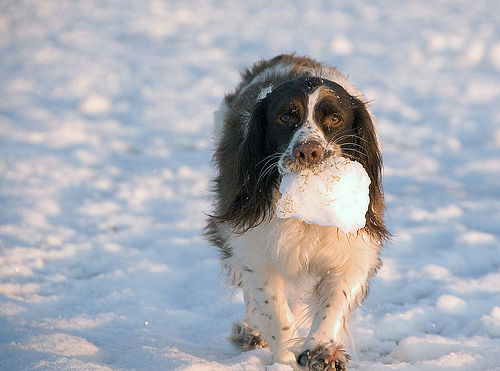

Индекс лучшего изображения: 64
Текст запроса - A skier makes the only path on an empty mountain .
Название изображения - 3163198309_bbfe504f0a.jpg
Метрика изображения - [0.5531253814697266]


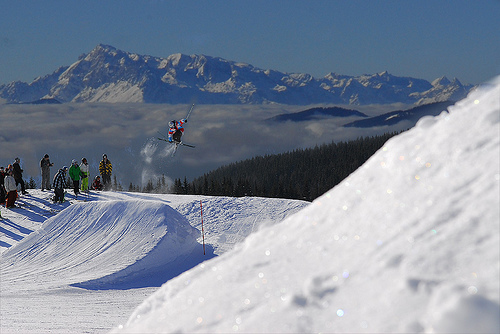

Индекс лучшего изображения: 90
Текст запроса - Men in a khaki-colored tent outside in a rundown area .
Название изображения - 3386953179_84c2d7922f.jpg
Метрика изображения - [0.13239488005638123]


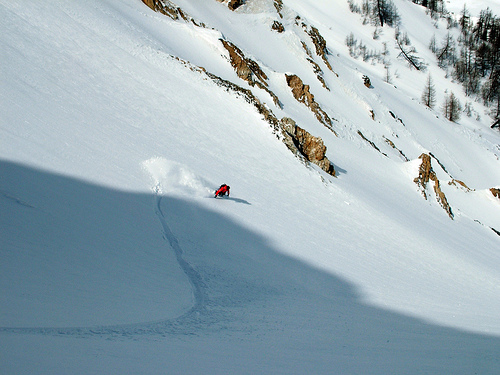

Индекс лучшего изображения: 0
Текст запроса - A group of people walk through a shopping mall .
Название изображения - 3356748019_2251399314.jpg
Метрика изображения - [0.1266939789056778]


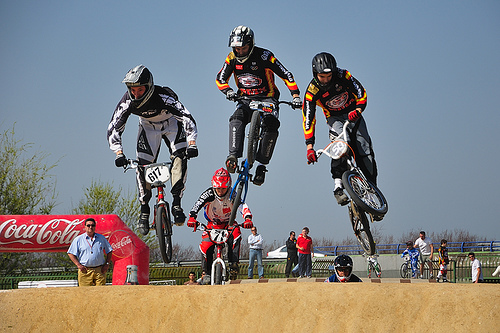

Индекс лучшего изображения: 0
Текст запроса - a large group of young people all dressed in white tops and green bottoms
Название изображения - 3356748019_2251399314.jpg
Метрика изображения - [0.12623155117034912]


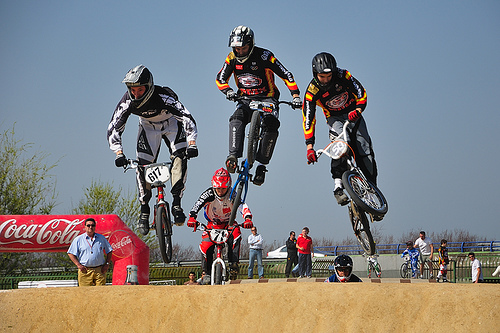

Индекс лучшего изображения: 64
Текст запроса - Women play lacrosse .
Название изображения - 3163198309_bbfe504f0a.jpg
Метрика изображения - [0.39614272117614746]


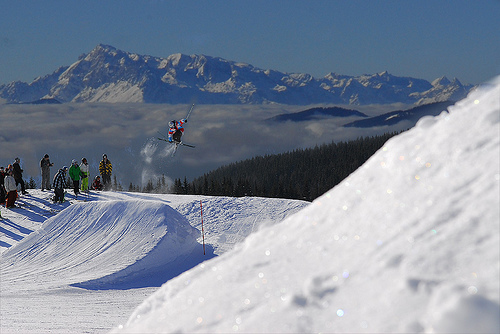

Индекс лучшего изображения: 14
Текст запроса - Two small white dogs are in a yard chasing a red ball .
Название изображения - 661749711_6f408dad62.jpg
Метрика изображения - [0.1815430372953415]


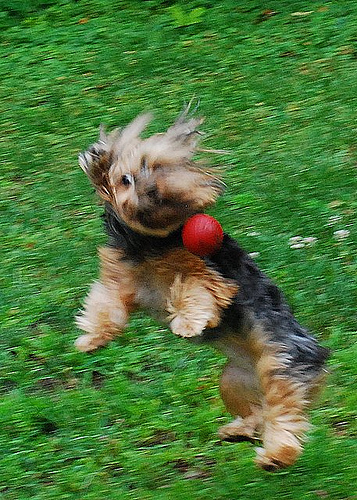

Индекс лучшего изображения: 64
Текст запроса - A man in a blue shirt lifts up his tennis racket and smiles .
Название изображения - 3163198309_bbfe504f0a.jpg
Метрика изображения - [0.13024812936782837]


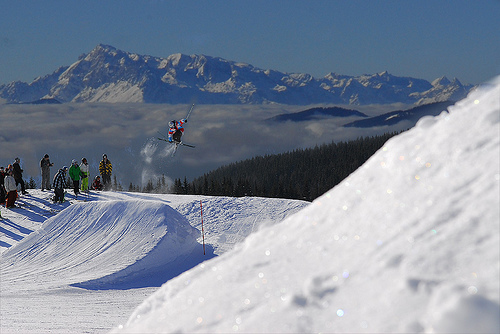

In [133]:
for i in range(10):
    random_value = test_queries.query_text.sample(n=1).item()
    image_selection(random_value)

Индекс лучшего изображения: 49
Текст запроса - A man , seen from the back , with his head turned to the side wearing a backpack
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [-14.20821762084961]


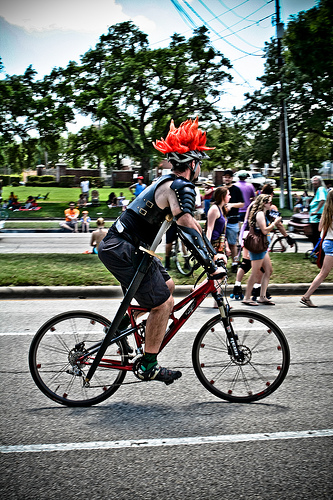

Индекс лучшего изображения: 49
Текст запроса - There is an older white haired lady and a bulldog sitting on a tree stump .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [1.6802253723144531]


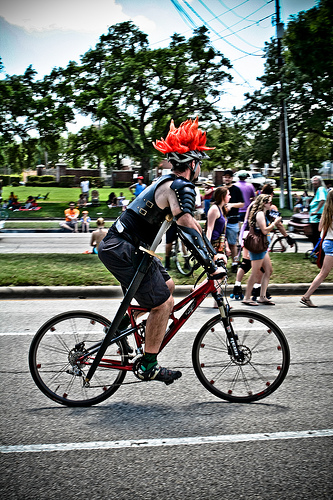

Индекс лучшего изображения: 49
Текст запроса - a biker rides down the street .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [-3.659191131591797]


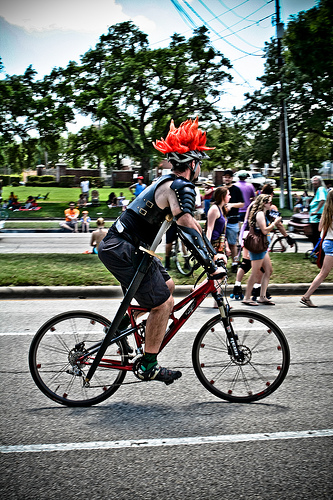

Индекс лучшего изображения: 49
Текст запроса - A group of people gather on the grass field and throw a pink hoop .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [13.03799057006836]


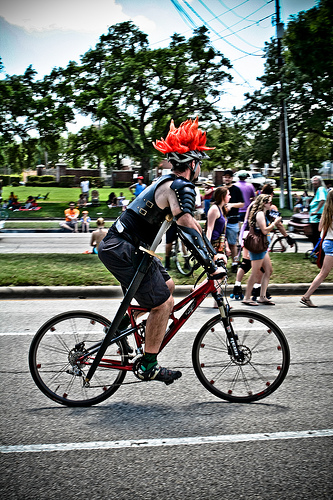

Индекс лучшего изображения: 49
Текст запроса - Two women dressed with scarves over their heads look angrily at the photographer .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [-2.641307830810547]


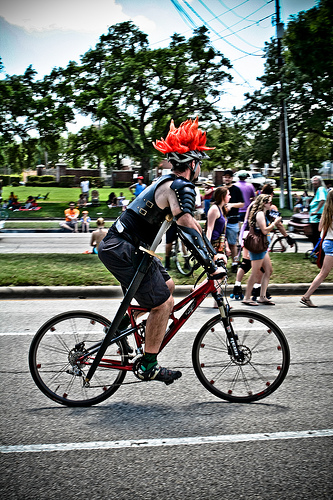

Индекс лучшего изображения: 49
Текст запроса - Young man on a trick bicycle jumps at the top of a graffiti covered ramp .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [12.430980682373047]


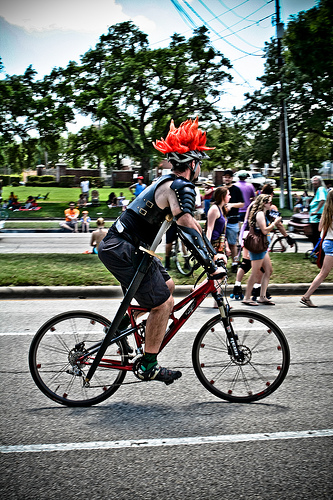

Индекс лучшего изображения: 49
Текст запроса - A group of people playing instruments in the woods .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [-2.6880226135253906]


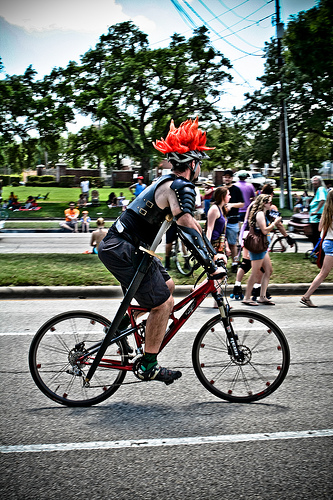

Индекс лучшего изображения: 49
Текст запроса - little dog is jumping up to catch a red ball in its mouth .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [1.0545272827148438]


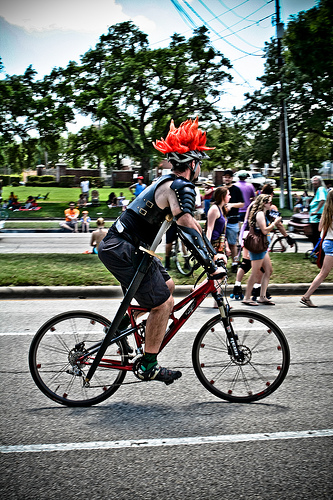

Индекс лучшего изображения: 49
Текст запроса - A group of women all dressed in red with yellow flower pins .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [-15.229984283447266]


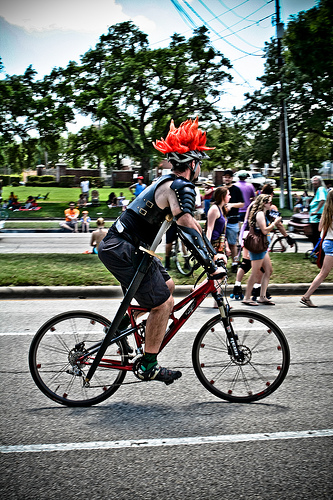

Индекс лучшего изображения: 49
Текст запроса - A group of friends play instruments in the middle of the woods .
Название изображения - 3517023411_a8fbd15230.jpg
Метрика изображения - [-8.700931549072266]


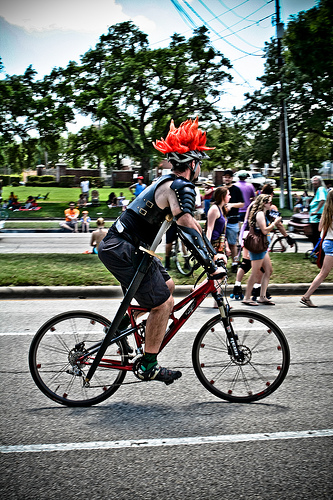

In [134]:
for i in range(10):
    random_value = test_queries.query_text.sample(n=1).item()
    image_selection_lr(random_value)

Модели справились не очень хорошо. В начале, когда я векторизировал текст с помощью TF-IDF, они справлялись ещё хуже. У нейросети и логистической регрессии примерно одинаковые проблемы, они обе улавливают детали на снимке, но вот объединить это воедино они не могут, из-за этого почти не попадают в суть картинки. Т. е. они понимают, что на картинке человек, но вообще не понимают, что он там делает. Группа людей, которые бегут, и группа людей, которые стоят, для них будет одно и тоже. Но тем не менее нейросеть справилась лучше так как у нее совпали 2 из 10 фото. А вот регрессия справилась по хуже она была близка (один раз даже очень) но не попала в точку.

### Вывод

Идея с поиском изображения по описанию реализуема. Для достижения желаемого результата необходимо обучить модель на большем количестве снимков с более качественной разметкой и большим количеством описаний. В проекте удалось достичь того, что модель подбирала подходящие фото по запросу. Лучше всего справилась модель нейронной сети. 